<a href="https://colab.research.google.com/github/Raihan4520/YOLO11/blob/main/Instance_Segmentation_YOLO11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Instance Segmentation** using YOLO11

In [1]:
# Check GPU (No free GPU available right now)
!nvidia-smi


Tue Oct  1 15:17:18 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   55C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
# Install the necessary libraries
!pip install ultralytics roboflow opencv-python pandas


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.4/881.4 kB 21.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 2.5 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


In [3]:
# Download the dataset
# !pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="*** Use Your Own API Key ***") # Use your API key here
project = rf.workspace("roboflow-universe-projects").project("fire-and-smoke-segmentation")
version = project.version(4)
dataset = version.download("yolov11")

# Dataset link: https://universe.roboflow.com/roboflow-universe-projects/fire-and-smoke-segmentation/dataset/4#


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Fire-and-Smoke-Segmentation-4 in yolov11:: 100%|██████████| 414/414 [00:00<00:00, 9257.81it/s]


In [4]:
# *** Change path in data.yaml file for Google Colab ***
# path: /content/Fire-and-Smoke-Segmentation-4
# test: test/images    # relative to 'path'
# train: train/images  # relative to 'path'
# val: valid/images    # relative to 'path'


In [5]:
# Train the YOLO11 model
from ultralytics import YOLO
import os

# Path to the data.yaml file
data_yaml_path = os.path.join(dataset.location, 'data.yaml')

# Initialize the YOLO11 model - using the nano model for speed
model = YOLO('yolo11n-seg.pt')  # Load a pretrained YOLO11 model

# Train the model
model.train(task='segment', mode='train', data=data_yaml_path, epochs=10) # task and mode are optional parameters

# Train using CLI (In this project all python code is used instead of CLI)
# !yolo task=segment mode=train model=yolo11n-seg.pt data=data_yaml_path epochs=10


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.90M/5.90M [00:00<00:00, 166MB/s]


Ultralytics 8.3.2 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolo11n-seg.pt, data=/content/Fire-and-Smoke-Segmentation-4/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, 

100%|██████████| 755k/755k [00:00<00:00, 38.5MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 138MB/s]

WARNING ⚠️ yolo11n.pt appears to require 'dill', which is not in Ultralytics requirements.
AutoInstall will run now for 'dill' but this feature will be removed in the future.
Recommend fixes are to train a new model using the latest 'ultralytics' package or to run a command with an official Ultralytics model, i.e. 'yolo predict model=yolov8n.pt'
requirements: Ultralytics requirement ['dill'] not found, attempting AutoUpdate...


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 10.6 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 2.2s, installed 1 package: ['dill']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

AMP: checks passed ✅


train: Scanning /content/Fire-and-Smoke-Segmentation-4/train/labels... 141 images, 0 backgrounds, 0 corrupt: 100%|██████████| 141/141 [00:00<00:00, 1588.22it/s]

train: New cache created: /content/Fire-and-Smoke-Segmentation-4/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.17 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /content/Fire-and-Smoke-Segmentation-4/valid/labels... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<00:00, 788.75it/s]

val: New cache created: /content/Fire-and-Smoke-Segmentation-4/valid/labels.cache


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/10      3.06G      1.565      3.937      3.606      1.657         29        640: 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.62it/s]

                   all         40         97    0.00604      0.742      0.168      0.111    0.00556      0.661      0.196      0.104



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.98G      1.365      3.142      3.248      1.533         29        640: 100%|██████████| 9/9 [00:04<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.04it/s]

                   all         40         97    0.00595      0.721      0.296      0.168     0.0055       0.64      0.293      0.153



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.97G      1.258      2.735      2.759      1.471         26        640: 100%|██████████| 9/9 [00:02<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.70it/s]

                   all         40         97    0.00664       0.79      0.349      0.229    0.00651      0.756       0.39      0.244



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.97G      1.285      2.532      2.448      1.436         27        640: 100%|██████████| 9/9 [00:02<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.44it/s]

                   all         40         97    0.00643       0.79      0.425       0.26    0.00627      0.756       0.44      0.248



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.96G      1.251      2.362      2.261      1.458         32        640: 100%|██████████| 9/9 [00:03<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]

                   all         40         97    0.00617      0.768      0.493      0.308    0.00634      0.777      0.503      0.283



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/10         3G      1.269      2.269      2.096      1.437         33        640: 100%|██████████| 9/9 [00:03<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.65it/s]

                   all         40         97      0.964      0.224      0.516      0.335      0.982      0.233      0.537      0.318



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.97G       1.17      2.249      1.911      1.313         35        640: 100%|██████████| 9/9 [00:02<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.51it/s]

                   all         40         97      0.964      0.224      0.547      0.373      0.962      0.209      0.549      0.295



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.96G      1.202      2.236      1.877      1.413         27        640: 100%|██████████| 9/9 [00:02<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.79it/s]

                   all         40         97      0.985      0.284      0.568      0.355          1      0.293      0.573       0.34



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.98G      1.159      2.117      1.914      1.325         26        640: 100%|██████████| 9/9 [00:04<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         40         97      0.893      0.418        0.6      0.388      0.905      0.426      0.601      0.366



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.98G      1.126      2.048      1.793      1.321         32        640: 100%|██████████| 9/9 [00:02<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.52it/s]

                   all         40         97      0.887      0.499      0.639      0.422      0.872      0.499       0.62      0.397



10 epochs completed in 0.017 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 6.0MB
Optimizer stripped from runs/segment/train/weights/best.pt, 6.0MB

Validating runs/segment/train/weights/best.pt...
Ultralytics 8.3.2 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n-seg summary (fused): 265 layers, 2,834,958 parameters, 0 gradients, 10.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.24it/s]


                   all         40         97      0.887        0.5       0.64      0.423       0.87      0.499       0.62      0.397
                  fire         40         58      0.846      0.672      0.771      0.569      0.868       0.69      0.801      0.554
                 smoke         28         39      0.927      0.327      0.509      0.277      0.872      0.308      0.439      0.241
Speed: 0.2ms preprocess, 3.3ms inference, 0.0ms loss, 3.5ms postprocess per image
Results saved to runs/segment/train


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ac4db1490c0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.04104

In [6]:
# Validate the model
metrics = model.val()

# Print the evaluation metrics
print("Model Evaluation Metrics:", metrics)


Ultralytics 8.3.2 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n-seg summary (fused): 265 layers, 2,834,958 parameters, 0 gradients, 10.2 GFLOPs


val: Scanning /content/Fire-and-Smoke-Segmentation-4/valid/labels.cache... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.43it/s]


                   all         40         97      0.887      0.499       0.64      0.424      0.872      0.499       0.62      0.397
                  fire         40         58      0.846      0.672       0.77       0.57      0.868       0.69      0.801      0.553
                 smoke         28         39      0.927      0.326      0.509      0.278      0.876      0.308      0.439      0.241
Speed: 0.5ms preprocess, 19.6ms inference, 0.0ms loss, 6.4ms postprocess per image
Results saved to runs/segment/train2
Model Evaluation Metrics: ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ac4b87cf0d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([     

In [7]:
# Export the model
# model.export(format='onnx')  # You can choose 'tflite', 'torchscript', etc.


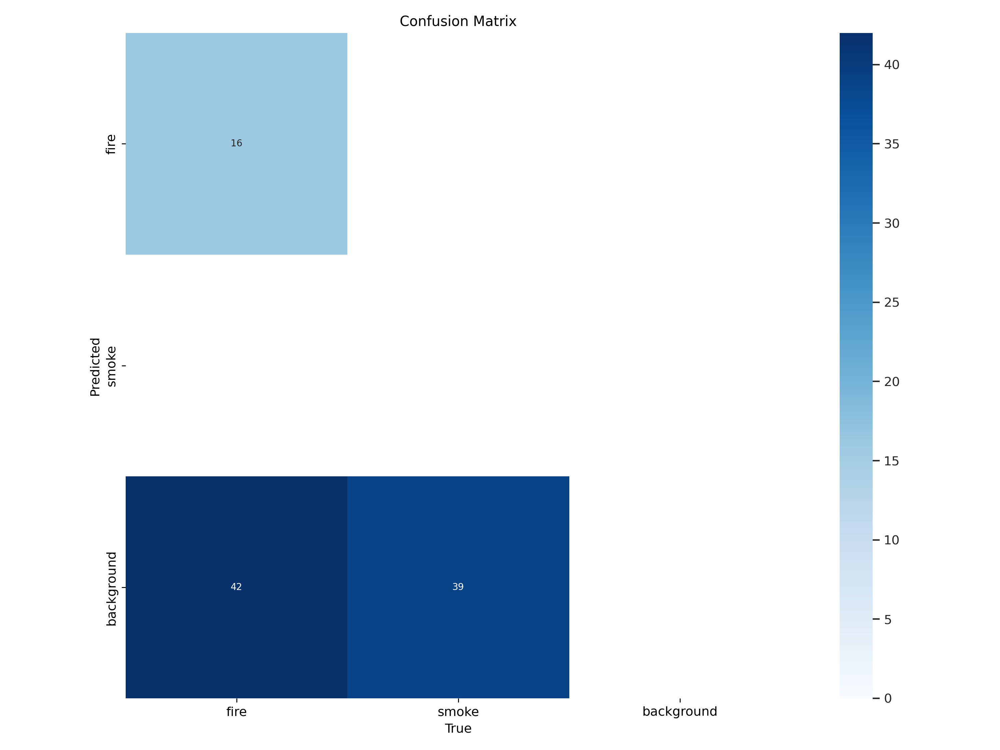

In [17]:
# Show Confusion Matrix
from IPython.display import Image, display
display(Image('/content/runs/segment/train/confusion_matrix.png'))


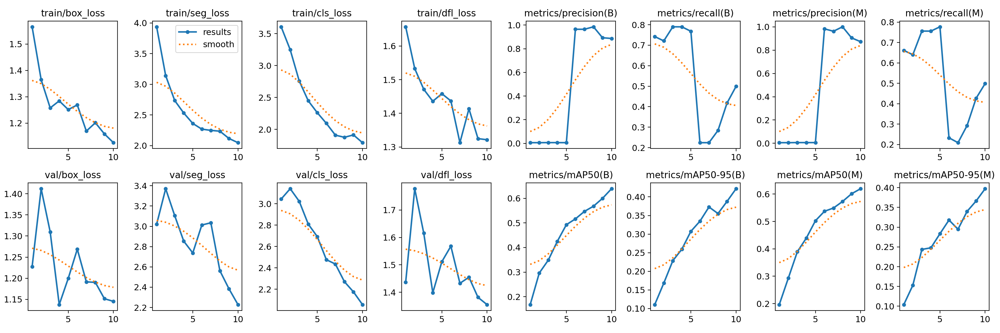

In [18]:
# Show Results (image)
display(Image('/content/runs/segment/train/results.png'))


In [19]:
# Show results (table)
import pandas as pd

# Load the CSV file into a pandas DataFrame
csv_file_path = '/content/runs/segment/train/results.csv'
df = pd.read_csv(csv_file_path)

# Display the DataFrame
print(df)


                     epoch           train/box_loss           train/seg_loss  \
0                        1                   1.5654                   3.9375   
1                        2                   1.3648                   3.1415   
2                        3                   1.2578                   2.7351   
3                        4                   1.2845                   2.5317   
4                        5                   1.2514                   2.3616   
5                        6                   1.2692                   2.2689   
6                        7                   1.1700                   2.2488   
7                        8                   1.2015                   2.2355   
8                        9                   1.1593                   2.1173   
9                       10                   1.1260                   2.0482   

            train/cls_loss           train/dfl_loss     metrics/precision(B)  \
0                   3.6064             

In [20]:
# Package imports and train path
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

train_path = '/content/runs/segment/train'


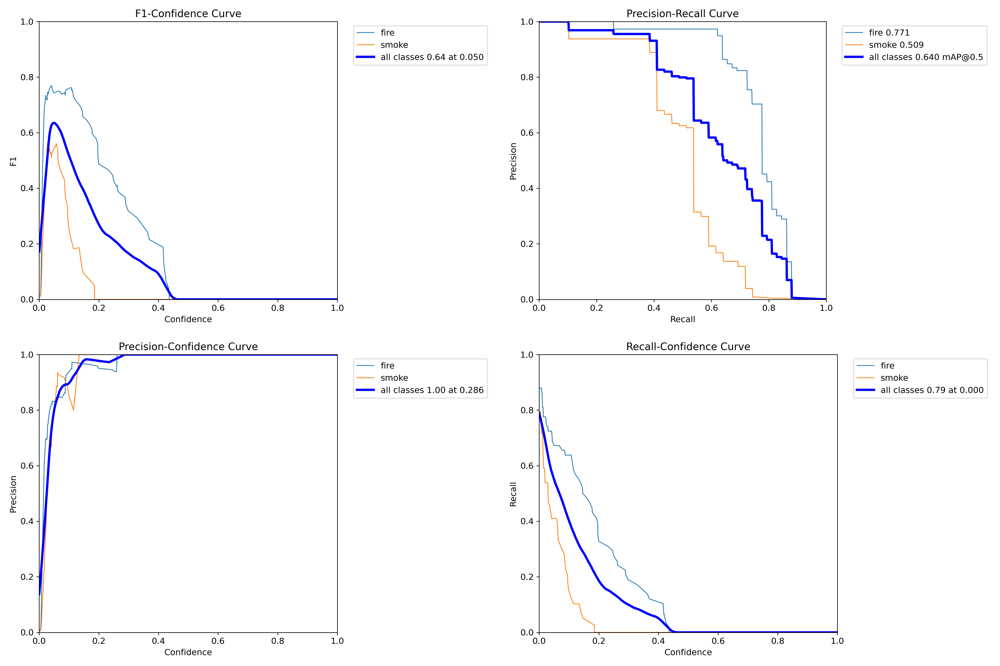

In [21]:
# Show box curves of F1-Confident, Precision-Recall, Precision-Confident and Recall-Confident

# Load your images using OpenCV
img1 = cv2.imread(f'{train_path}/BoxF1_curve.png')
img2 = cv2.imread(f'{train_path}/BoxPR_curve.png')
img3 = cv2.imread(f'{train_path}/BoxP_curve.png')
img4 = cv2.imread(f'{train_path}/BoxR_curve.png')

# Concatenate images horizontally
top_row = cv2.hconcat([img1, img2])
bottom_row = cv2.hconcat([img3, img4])

# Concatenate the two rows vertically
grid = cv2.vconcat([top_row, bottom_row])

# Display the concatenated image
cv2_imshow(grid)


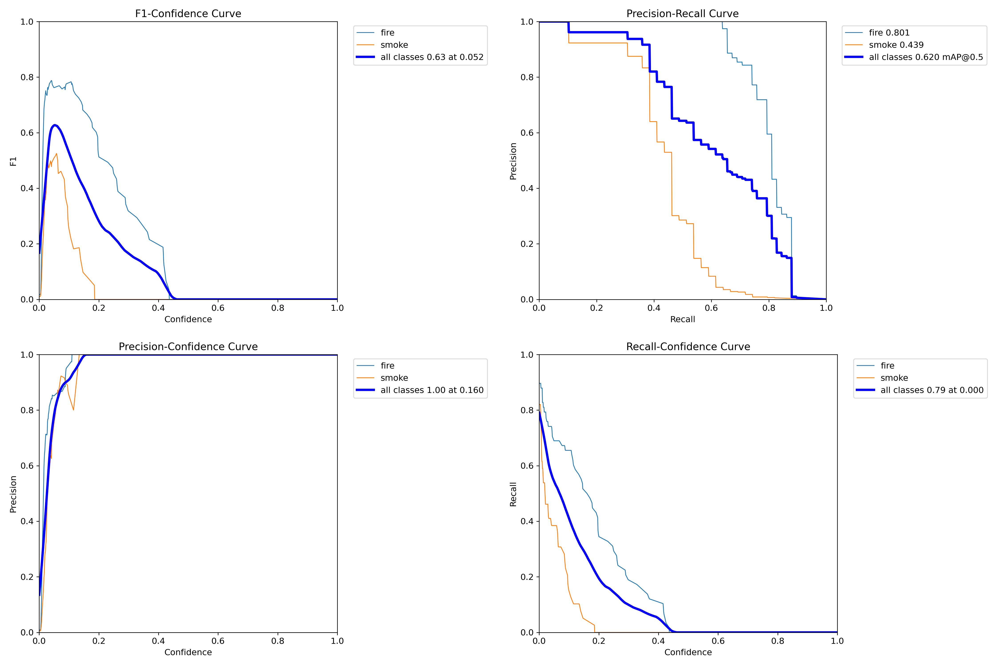

In [22]:
# Show mask curves of F1-Confident, Precision-Recall, Precision-Confident and Recall-Confident

# Load your images using OpenCV
img1 = cv2.imread(f'{train_path}/MaskF1_curve.png')
img2 = cv2.imread(f'{train_path}/MaskPR_curve.png')
img3 = cv2.imread(f'{train_path}/MaskP_curve.png')
img4 = cv2.imread(f'{train_path}/MaskR_curve.png')

# Concatenate images horizontally
top_row = cv2.hconcat([img1, img2])
bottom_row = cv2.hconcat([img3, img4])

# Concatenate the two rows vertically
grid = cv2.vconcat([top_row, bottom_row])

# Display the concatenated image
cv2_imshow(grid)


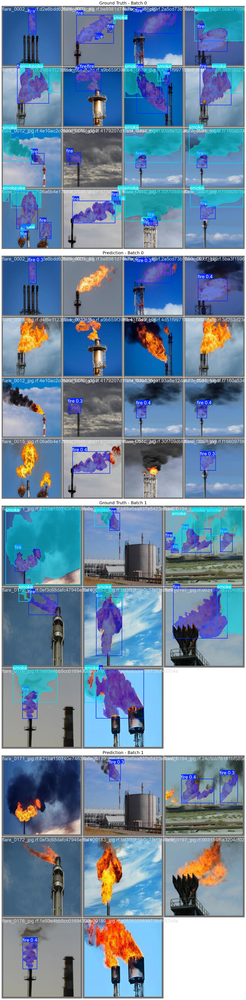

In [24]:
# Validation Results: Ground Truth vs Prediction

# Load your images using matplotlib's imread
img1 = mpimg.imread(f'{train_path}/val_batch0_labels.jpg')
img2 = mpimg.imread(f'{train_path}/val_batch0_pred.jpg')
img3 = mpimg.imread(f'{train_path}/val_batch1_labels.jpg')
img4 = mpimg.imread(f'{train_path}/val_batch1_pred.jpg')

# Get image dimensions (assuming all images are of the same size)
img_height, img_width, _ = img1.shape

# Create a figure with subplots, adjusting the figure size to match the image size
fig, axes = plt.subplots(4, 1, figsize=(img_width / 100, 4 * img_height / 100))  # 4 rows, 1 column

# Add a title to the figure with a bigger font size
# fig.suptitle('Validation Results: Ground Truth vs Prediction', fontsize=24)

# Plot the images and add larger titles for each subplot
axes[0].imshow(img1)
axes[0].set_title("Ground Truth - Batch 0", fontsize=22)  # Larger subplot title
axes[1].imshow(img2)
axes[1].set_title("Prediction - Batch 0", fontsize=22)

axes[2].imshow(img3)
axes[2].set_title("Ground Truth - Batch 1", fontsize=22)
axes[3].imshow(img4)
axes[3].set_title("Prediction - Batch 1", fontsize=22)

# Turn off axes for all subplots
for ax in axes:
    ax.axis('off')

# Adjust layout to prevent overlap and show the title
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Display the plot
plt.show()


In [25]:
# Predict on test data using trained model

# Load trained model
model = YOLO('/content/runs/segment/train/weights/best.pt')

# Specify the test folder path
test_path = '/content/Fire-and-Smoke-Segmentation-4/test/images'

# List all images in the test folder
image_files = [os.path.join(test_path, img) for img in os.listdir(test_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Predict each images
for img_path in image_files:
    results = model.predict(source=img_path, save=True, conf=0.50)



image 1/1 /content/Fire-and-Smoke-Segmentation-4/test/images/flare_0199_jpg.rf.e20913c2f95c18dae267eed64f3e11a3.jpg: 640x640 (no detections), 17.7ms
Speed: 2.8ms preprocess, 17.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict

image 1/1 /content/Fire-and-Smoke-Segmentation-4/test/images/flare_0222_jpg.rf.ce0ac1618ab9859a0c55a734eaa19ade.jpg: 640x640 (no detections), 15.7ms
Speed: 2.0ms preprocess, 15.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict

image 1/1 /content/Fire-and-Smoke-Segmentation-4/test/images/flare_0089_jpg.rf.4b52d9620ee0c678eda0fae322f2f8d6.jpg: 640x640 (no detections), 15.7ms
Speed: 2.0ms preprocess, 15.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict

image 1/1 /content/Fire-and-Smoke-Segmentation-4/test/images/flare_0217_jpg.rf.c7d3f21fb4751fc3c7a680bd0b27f517.jpg: 640x640 (no detections), 15

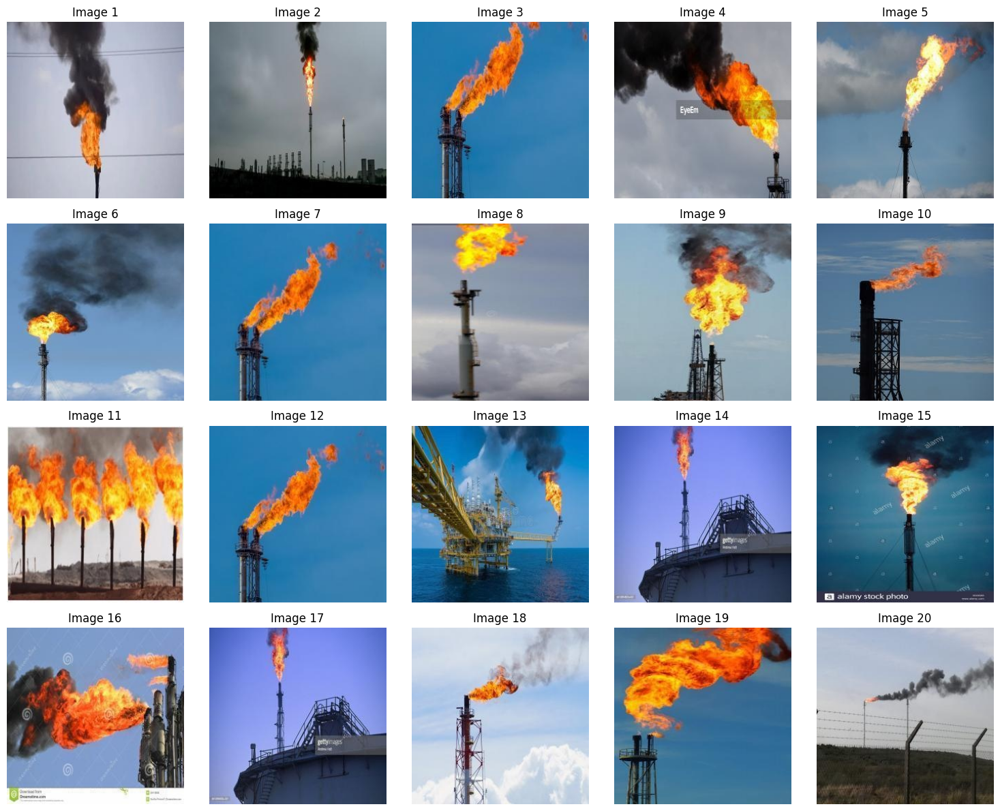

In [26]:
# Plot prediction on test images

# Specify the predict folder path
pred_path = '/content/runs/segment/predict'

# List all images in the predict folder
pred_image_files = [os.path.join(pred_path, img) for img in os.listdir(pred_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Number of images per row
images_per_row = 5

# Calculate the number of rows needed
n_rows = len(pred_image_files) // images_per_row + int(len(pred_image_files) % images_per_row != 0)

# Set figure size
fig, axs = plt.subplots(n_rows, images_per_row, figsize=(15, 3 * n_rows))

# Flatten axes if necessary (for easier iteration)
axs = axs.flatten()

# Loop through each image and display it
for i, img_path in enumerate(pred_image_files):
    img = mpimg.imread(img_path)      # Read the image
    axs[i].imshow(img)                # Show the image
    axs[i].axis('off')                # Turn off axis
    axs[i].set_title(f"Image {i+1}")  # Add title

# Hide any extra empty subplots (if the number of images is not a perfect multiple of images_per_row)
for j in range(i+1, len(axs)):
    axs[j].axis('off')  # Hide unused axes

# Display all images
plt.tight_layout()
plt.show()


# This project is only for learning purpose
The accuracy of the model is very low because it has been trained over very few epochs.